<a href="https://www.kaggle.com/code/kalviskalnins/gans-training?scriptVersionId=154640718" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
import os
import time
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, models
import pathlib
import datetime
from IPython import display

# Enable GPU memory growth
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)
        
AUTOTUNE = tf.data.experimental.AUTOTUNE
# Definējam konstantes
BUFFER_SIZE = 400
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256
OUTPUT_CHANNELS = 3
LAMBDA = 150

# Paths for Kaggle environment
train_satellite_dir = '/kaggle/input/dataset/processed_satellite'
train_roadmap_dir = '/kaggle/input/dataset/processed_roadmap'
test_satellite_dir = '/kaggle/input/dataset/test_satellite'


/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


# Definējam attēlu apstrādes funkcijas, lai gan mums tās ļoti vajadzīgas nav, tās dod attēlu dažādību.
Ja nebūtu pietiekami liels dataset, tad varētu to paplašināt izmantojot šīs funkcijas augmentācijai.

In [2]:
def resize(satellite_image, roadmap_image, height, width):
    satellite_image = tf.image.resize(satellite_image, [height, width],
                                      method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    roadmap_image = tf.image.resize(roadmap_image, [height, width],
                                    method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return satellite_image, roadmap_image

In [3]:
def random_crop(satellite_image, roadmap_image, height=256, width=256):
    stacked_image = tf.stack([satellite_image, roadmap_image], axis=0)
    cropped_image = tf.image.random_crop(stacked_image, size=[2, height, width, 3])
    return cropped_image[0], cropped_image[1]

In [4]:
# # Normalize the images to [-1, 1]
# def normalize(satellite_image, roadmap_image):
#     satellite_image = (satellite_image / 127.5) - 1
#     roadmap_image = (roadmap_image / 127.5) - 1
#     return satellite_image, roadmap_image

In [5]:
@tf.function()
def random_jitter(satellite_image, roadmap_image):
    # resizing to 286 x 286 x 3
    satellite_image, roadmap_image = resize(satellite_image, roadmap_image, 286, 286)

    # randomly cropping to 256 x 256 x 3
    satellite_image, roadmap_image = random_crop(satellite_image, roadmap_image)

    if tf.random.uniform(()) > 0.5:
        # Random mirroring
        satellite_image = tf.image.flip_left_right(satellite_image)
        roadmap_image = tf.image.flip_left_right(roadmap_image)

    return satellite_image, roadmap_image

# Definējam funkcijas ar kurām apstrādājam attēlus un ielādējam tos tf.datatset.
Ar šādu struktūru dataset neaizņem daudz vietas un tā kā attēlu nav ļoti daudz, visus varam ielādēt reizē - nav nepieciešams implementēt kādu lazy loading, kur visus attēlus neielādē reizē(vēl viens cloud computing bonuss, uz laptopa visus attēlus atverot reizē ātri piepildās atmiņa).

In [6]:
def load_image_train(satellite_file):
    # Construct the corresponding roadmap file path
    roadmap_file = tf.strings.regex_replace(satellite_file, "satellite", "roadmap")

    # Read and decode the satellite image
    satellite_image = tf.io.read_file(satellite_file)
    satellite_image = tf.image.decode_jpeg(satellite_image, channels=3)

    # Read and decode the roadmap image
    roadmap_image = tf.io.read_file(roadmap_file)
    roadmap_image = tf.image.decode_jpeg(roadmap_image, channels=3)

    # Cast to float32 and normalize both images to [-1,1]
    satellite_image = (tf.cast(satellite_image, tf.float32) / 127.5) - 1.0
    roadmap_image = (tf.cast(roadmap_image, tf.float32) / 127.5) - 1.0

    # Apply preprocessing functions
    satellite_image, roadmap_image = random_jitter(satellite_image, roadmap_image)

    return satellite_image, roadmap_image


In [7]:
def load_image_test(satellite_file):
    # Construct the corresponding roadmap file path
    roadmap_file = tf.strings.regex_replace(satellite_file, "satellite", "roadmap")

    # Read and decode the satellite image
    satellite_image = tf.io.read_file(satellite_file)
    satellite_image = tf.image.decode_jpeg(satellite_image, channels=3)

    # Read and decode the roadmap image
    roadmap_image = tf.io.read_file(roadmap_file)
    roadmap_image = tf.image.decode_jpeg(roadmap_image, channels=3)
    
    satellite_image, roadmap_image = resize(satellite_image, roadmap_image, 256, 256)

    # Cast to float32 and normalize both images to [-1,1]
    satellite_image = (tf.cast(satellite_image, tf.float32) / 127.5) - 1.0
    roadmap_image = (tf.cast(roadmap_image, tf.float32) / 127.5) - 1.0

    return satellite_image, roadmap_image


In [8]:
# Create TensorFlow datasets
train_dataset = tf.data.Dataset.list_files(train_satellite_dir + '/*.jpg')
train_dataset = train_dataset.map(load_image_train, num_parallel_calls=AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

test_dataset = tf.data.Dataset.list_files(test_satellite_dir + '/*.jpg')
test_dataset = test_dataset.map(load_image_test, num_parallel_calls=AUTOTUNE)
test_dataset = test_dataset.batch(BATCH_SIZE)


# Tālāk definējam ģeneratoru un diskriminatoru, kā arī to kļūdas funkcijas

**Sākumā izveidosim encoderi un decoderi, jo tie tiek izmantoti ģeneratoram U-Net struktūrā:**
* Katrā encodera slānī ir: konvolūcija $\rightarrow$ normalizācija $\rightarrow$ LeakyReLU
* Katrā decodera slānī ir: Transponēta konvolūcija $\rightarrow$ normalizācija $\rightarrow$ Dropout(pirmajiem trīs slāņiem) $\rightarrow$ ReLU

Izskatās sarežģīti, bet tam visam ir iebūvētas keras funkcijas :)

In [9]:
# define encoder
def downsample(filters, size, apply_batchnorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = models.Sequential()
    result.add(layers.Conv2D(filters, size, strides=2,
                             padding='same', kernel_initializer=initializer,
                             use_bias=False))

    if apply_batchnorm:
        result.add(layers.BatchNormalization())

    result.add(layers.LeakyReLU())

    return result

In [10]:
# define decoder
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = models.Sequential()
    result.add(layers.Conv2DTranspose(filters, size, strides=2,
                                      padding='same', kernel_initializer=initializer,
                                      use_bias=False))

    result.add(layers.BatchNormalization())

    if apply_dropout:
        result.add(layers.Dropout(0.5))

    result.add(layers.ReLU())

    return result

Tālāk pabeidzam būvēt ģeneratoru pēc U-net struktūras

In [11]:
def Generator():
    inputs = tf.keras.layers.Input(shape=[256, 256, 3])

    down_stack = [
        downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
        downsample(128, 4),  # (batch_size, 64, 64, 128)
        downsample(256, 4),  # (batch_size, 32, 32, 256)
        downsample(512, 4),  # (batch_size, 16, 16, 512)
        downsample(512, 4),  # (batch_size, 8, 8, 512)
        downsample(512, 4),  # (batch_size, 4, 4, 512)
        downsample(512, 4),  # (batch_size, 2, 2, 512)
        downsample(512, 4),  # (batch_size, 1, 1, 512)
    ]

    up_stack = [
        upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
        upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
        upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
        upsample(512, 4),  # (batch_size, 16, 16, 1024)
        upsample(256, 4),  # (batch_size, 32, 32, 512)
        upsample(128, 4),  # (batch_size, 64, 64, 256)
        upsample(64, 4),  # (batch_size, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

    x = inputs

  # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

**Diskriminatora struktūra atšķirās no ģeneratora:**
* Katra slāņa sastāvs ir: konvolūcija  →  normalizācija  →  LeakyReLU, kas sakrīt ar encoder uzbūvi, tāpēc varam izmantot iepriekš definēto downsample()
* Izmērs pēc pēdējā diskriminatora slāņa ir (*batch_size*, 30, 30, 1)
* Diskrminatoram ir divi ievades dati: 1) satelīta attēls un kartes attēls, 2) satelīta attēls un ģenerētais attēls

In [12]:

def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)

    inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
    tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

    x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

    down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
    down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
    down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
    conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

    batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

    leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

    last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

    return tf.keras.Model(inputs=[inp, tar], outputs=last)
     

# Kļūdas funkciju definēšana

Diskriminatoram izmantojam sigmoid_crossentropy, lai iegūtu divas kļūdas, kuras vienkārši saskaitām kopā.
* real_loss iegūstam varbūtību, ka testa attēlu diskriminators uzskata par īstu(tāpēc salīdzinam ar vieninieku masīvu)
* generate_loss iegūstam varbūtību, ka ģenerēto attēlu diskriminators uzskata par viltotu(tāpēc salīdzinam ar nuļļu masīvu)

Ģeneratoram arī ir divas kļūdas, bet saskaitot ieviešam koeficientu lambda, ar kuru varam izvēlēties kurai kļūdas funkcijai vairāk vēlamies pielāgoties. Ja Lambda=0, tad ģenerētie attēli būs asi, bet ar artefaktiem. Ar lambda = 100, artefaktus samazinam, un ģenerētais attēls vēl nepaliek miglains.
* real_loss iegūstam varbūtību, ka ģenerēto attēlu diskriminants uzskata par īstu(tāpēc salīdzinam ar vieninieku masīvu)
* l1_ loss salīdzinām cik ļoti ģenerētais attēls atšķirās no testa attēla 


In [13]:
# Define the loss functions
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)


def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

    total_disc_loss = real_loss + generated_loss

    return total_disc_loss

def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

    # Mean absolute error
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

    total_gen_loss = gan_loss + (LAMBDA * l1_loss)

    return total_gen_loss, gan_loss, l1_loss
     

# definējam optimizatorus
*Vienā brīdī tie sāka mest errorus(izmēru nesakritība)iespējams tāpēc, ģenerētās bildes satur nevēlamus artefaktus. Nesanāca salabot*

In [14]:
# Define the optimizers
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

generator = Generator()
discriminator = Discriminator()

# Izveidojam checkpoint sistēmu

Ir atšķirīgi save_checkpoint un load_checkpoint, jo šī programma tiek izmantota gan, lai trenētu, gan pārbaudītu trenētos modeļus. Kaggle vidē trenēšana notiek saglabājot jaunu versiju, tāpēc saglabātie modeļi ir jāievieto input directory, tāpēc ir load_checkpoint_dir. Savukārt, trenējot modeli saglabāt varam tikai working directory.

Varbūt nav tā labākā sistēma, bet tā ir principā nemainīta kopš pirmās versijas. 

In [15]:
# Define the checkpoint directory for saving
save_checkpoint_dir = '/kaggle/working/model_checkpoints'
os.makedirs(save_checkpoint_dir, exist_ok=True)

# Define the checkpoint directory for loading (if necessary)
load_checkpoint_dir = '/kaggle/input/results/results/model_checkpoints'

# Create a checkpoint instance
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

# Create a CheckpointManager for saving the checkpoint
save_manager = tf.train.CheckpointManager(checkpoint, save_checkpoint_dir, max_to_keep=3)

# Create a CheckpointManager for loading the checkpoint (if necessary)
load_manager = tf.train.CheckpointManager(checkpoint, load_checkpoint_dir, max_to_keep=3)


# Definējam attēlu ģenerēšanas funkciju

In [16]:
def generate_images(model, test_input, tar):
    # ar gen modeli izveidojam attēlu no satelīta attēla.
    prediction = model(test_input, training=True) # training=True lietojam, jo vēlamies batch vērtības, nevis akumulēto statistiku no test_dataset
    plt.figure(figsize=(15, 15))
    
    
    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']
    
    
    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        # Šobrīd attēlu vērtības ir normalizētas intervālā [-1,1], tāpēc normējam tās uz [0,1]
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()
     

# Definējam summary_writer, ar kuru iegūsim info par kļūdas funkcijām no TensorBoard

In [17]:
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

# Trenēšanas funkcija

In [18]:

@tf.function # šis nepieciešams, lai varētu saglabāt summary logs
def train_step(input_image, target, step):
    # tbh nākamo rindu līdz galam nesaprotu, bet tā ir nepieciešama, lai pēc tam tensorflow automātiski varētu aprēķināt gradientus
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape: 
        gen_output = generator(input_image, training=True) # ģenerējam attēlu

        disc_real_output = discriminator([input_image, target], training=True) # diskrimantoru darbinām uz īstā attēla
        disc_generated_output = discriminator([input_image, gen_output], training=True) # diskriminatoru darbinām uz fake attēla
        
        # iegūstam kļūdas
        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)
    
    # Aprēķinām gradientus
    generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)
    
    # Pielietojam gradientus
    generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))
    
    # logojam kļūdu vērtības
    with summary_writer.as_default():
        tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
        tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
        tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
        tf.summary.scalar('disc_loss', disc_loss, step=step//1000)
     

# Actual trenēšanas funkcija

Izmantojam soļus nevis ēras, jo kods ir balstīts uz vispārīga modeļa, kas pielāgots arī ļoti lieliem dataset, kur ēras tiek trenētas ilgi. Šo varētu pielāgot, bet attēlu kļūdas rodas drīzāk optimizer error, dataset vai trenēšanas ilguma dēļ.

In [19]:
def fit(train_ds, test_ds, steps, start_step=1100000): # start step manuāli mainām uz most recent checkpoint, ja vēlamies turpināt trenēt modeli
                                                       # (tik maz jāmaina, ka labāk manuāli nomainu skaitli, nevis mēģinu no file name ekstraktēt numuru,
                                                       # un riskēju salauzt kaut ko)
        
    example_input, example_target = next(iter(test_ds.take(1))) # izvēlamies vienu attēlu no testa kopas, kuram ik pēc 1000 soļiem ģenerējam attēlu
                                                                # šis ir noderīgi tikai trenējot notebook environment, ko īsti nedara, jo
                                                                # kā jau minēju, kaggle vidē trenēšana notiek saglabājot versiju, kur ir parasta konsole, nevis
                                                                # ipython. Ir noderīgi, lai apskatītu kā attīstās ģenerators dažos pirmajos tūkstošos soļu.
    start = time.time()
    
    # cikls, lai skaitītu soļus
    for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
        current_step = start_step + step  # Calculate the current step based on the offset

        if current_step % 1000 == 0:
            display.clear_output(wait=True)

            if current_step != start_step:  # Check if it's not the first step of the resumed training
                print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

            start = time.time()

            generate_images(generator, example_input, example_target)
            print(f"Step: {current_step//1000}k")

        train_step(input_image, target, current_step)

        # Training step
        if (current_step + 1) % 10 == 0:
            print('.', end='', flush=True)

        if (current_step + 1) % 5000 == 0:
            save_path = save_manager.save(checkpoint_number=current_step + 1)
            print(f"Saved checkpoint for step {current_step + 1}: {save_path}")


# Ielādējam modeli, no kura vēlamies sākt trenēšanu.

Ja vēlamies sākt trenēt no jauna, aizkomentējam **load_checkpoint(checkpoint_path)**

Sīkāka informācija par directory results0, results1... redzama results dataset lapā

In [54]:
def load_checkpoint(checkpoint_path):
    
    try:
        # Restore the checkpoint
        checkpoint.restore(checkpoint_path).assert_existing_objects_matched()

        print(f"Checkpoint restored from {checkpoint_path}")
    except Exception as e:
        print(f"Error restoring checkpoint: {e}")

checkpoint_path = '/kaggle/input/results/results0/model_checkpoints/ckpt-500000'  # no input izvēlamies checkpoint, kuru vēlamies ielādēt
                                                                                  # checkpoint path vērtība ir bez prefix(līdz punktam, neieskaitot)
load_checkpoint(checkpoint_path)


Checkpoint restored from /kaggle/input/results/results0/model_checkpoints/ckpt-500000


# Lai trenētu pārliecināties, ka nav komentēta

Steps parametrs norāda cik daudz trenēsim tīklu – ja turpinām no 500k, un steps = 500k, tad beidzot trenēšanu step būs 1000k

In [35]:
# fit(train_dataset, test_dataset, steps = 500000)

# Lai pārbaudītu modeļa darbību, aizkomentējam augšējo rindu un 

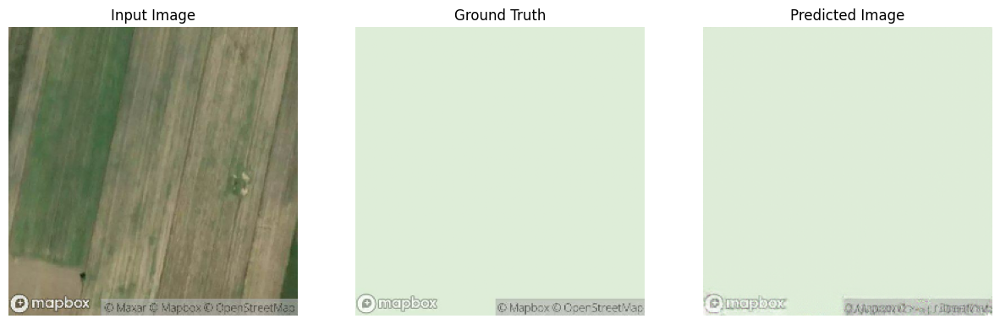

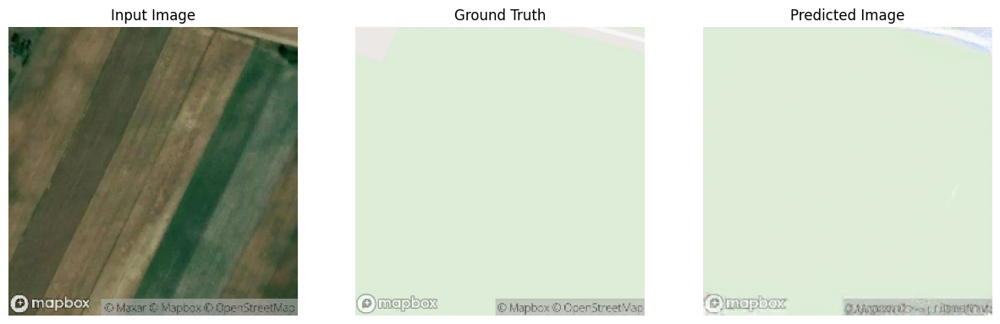

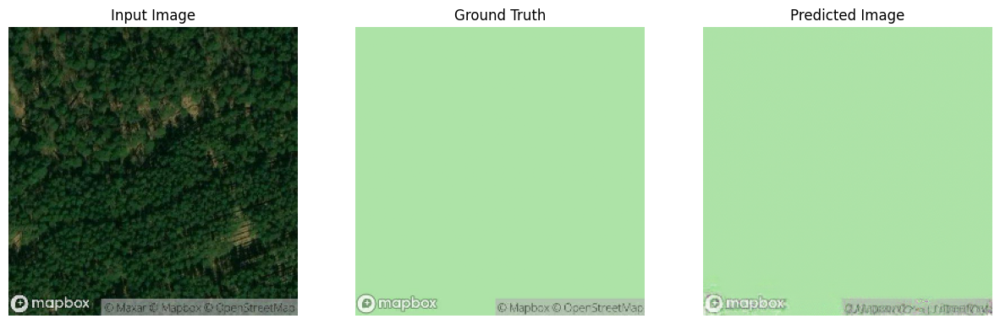

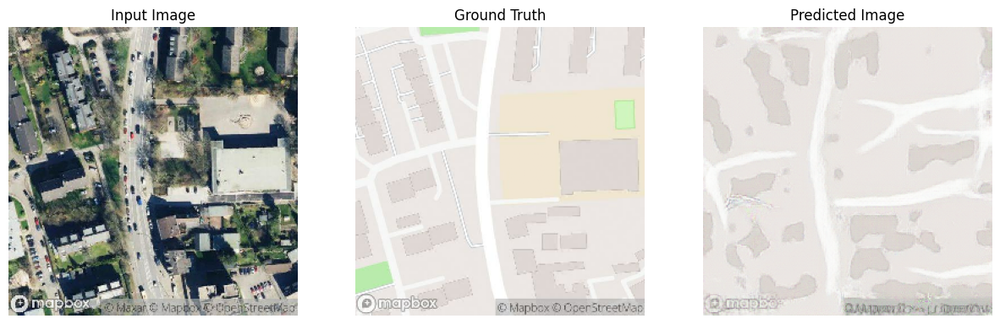

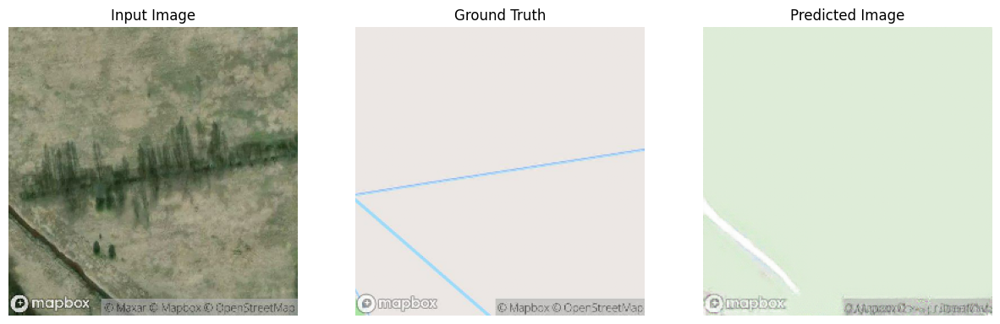

...

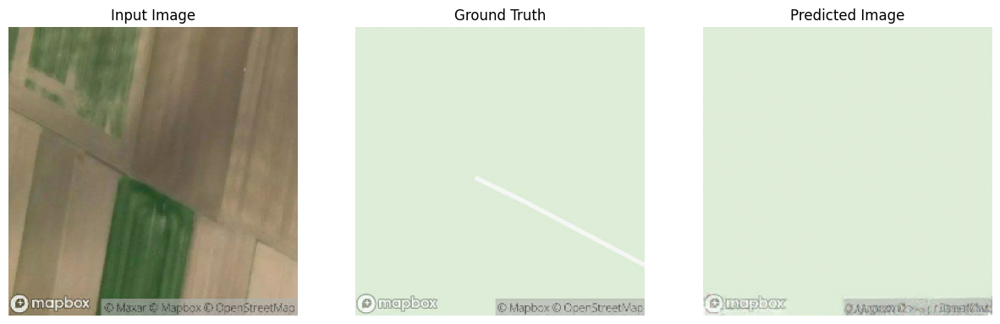

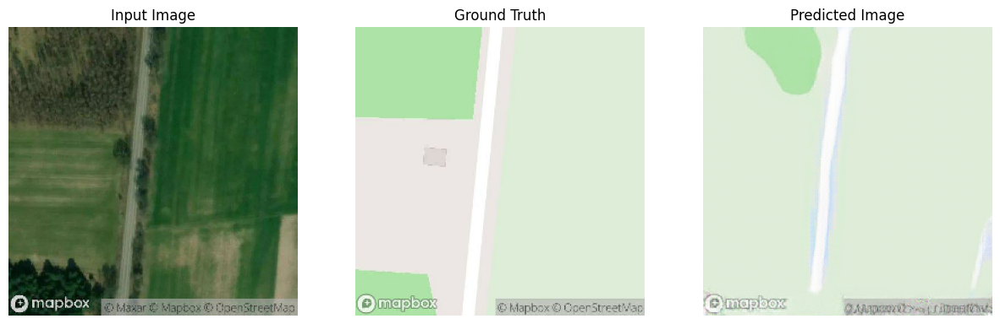

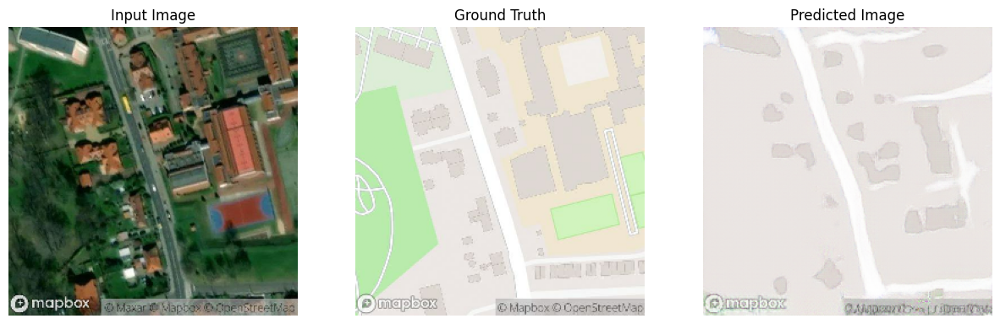

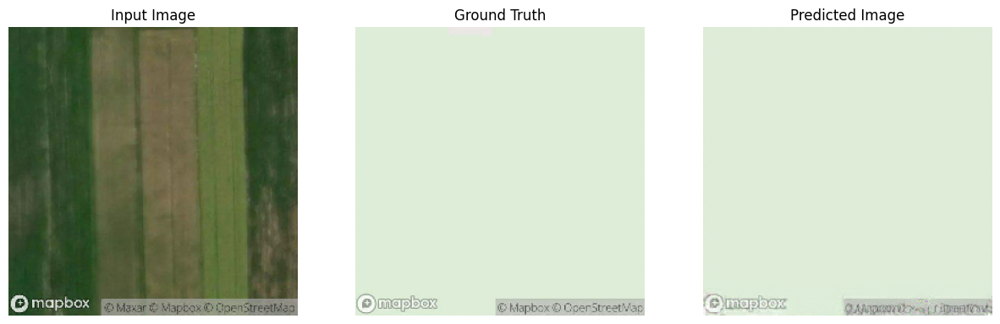

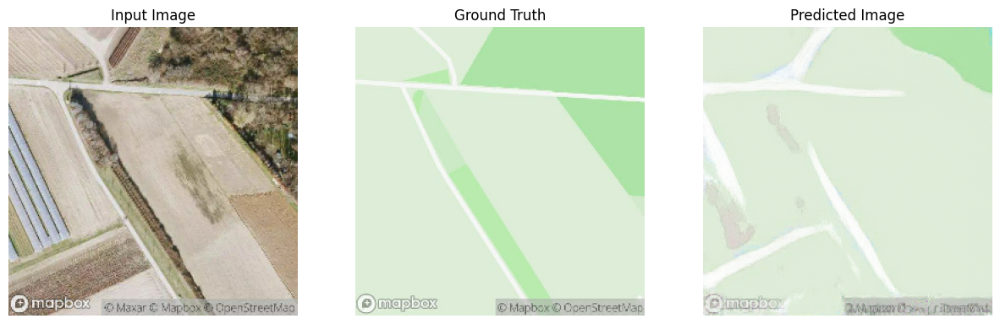

In [56]:
for inp, tar in test_dataset.take(30):
    generate_images(generator, inp, tar)